In [44]:
import pandas as pd
import numpy as np

from shapely.geometry import Point, shape, mapping
from shapely.ops import unary_union

import matplotlib.pyplot as plt

#from geoband.API import *
import folium
import json
import geopandas as gpd
from geopandas import gpd

from folium import plugins
import re

## 0. 센서 위치 확인

In [45]:
censor = pd.read_csv("data/censor.csv",header = 1)
censor.head()

,순번,설치년도,시리얼번호,자치구,주소,위도,경도,지면높이,센서,지역특성\n추가 필요,...,소음,조도,자외선,풍향/풍속,진동,흑구 온도,대기오염\n(CO/NO2/SO2),악취\n(NH3/H2S),유동인구,흑구
0,1,2019,V02Q1940046,구로구,서울특별시 구로구 궁동 212-15,37.494403,126.831472,3.1,기본,NaN,...,O,O,O,NaN,O,NaN,NaN,NaN,NaN,NaN
1,2,2019,V02Q1940111,구로구,서울특별시 구로구 신도림동 292-212,37.509299,126.878380,4.1,기본,NaN,...,O,O,O,NaN,O,NaN,NaN,NaN,NaN,NaN
2,3,2019,V02Q1940165,구로구,서울특별시 구로구 오류동 38-29,37.496892,126.843727,4.2,기본,NaN,...,O,O,O,NaN,O,NaN,NaN,NaN,NaN,NaN
3,4,2019,V02Q1940056,구로구,서울특별시 구로구 오류동 182-22,37.487430,126.838527,3.8,기본,NaN,...,O,O,O,NaN,O,NaN,NaN,NaN,NaN,NaN
4,5,2019,V02Q1940047,구로구,서울특별시 구로구 가리봉동 110-16,37.482145,126.889339,3.8,기본,NaN,...,O,O,O,NaN,O,NaN,NaN,NaN,NaN,NaN


In [46]:
censor2 = censor.iloc[:,[2,5,6]]
censor2 = censor2.loc[censor.iloc[:,5].isnull()==False,:]
censor2.columns = ["serial","lat","lon"]
censor2 = censor2.reset_index(drop=True)

In [47]:
censor_gpd = gpd.GeoDataFrame(
    censor2,
    crs={'init': 'epsg:4326'},
    geometry=[Point(xy) for xy in zip(censor2.lon, censor2.lat)])

/Users/seungji/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [48]:
censor2.shape

(1060, 4)

In [49]:
censor2

,serial,lat,lon,geometry
0,V02Q1940046,37.494403,126.831472,POINT (126.83147 37.49440)
1,V02Q1940111,37.509299,126.878380,POINT (126.87838 37.50930)
2,V02Q1940165,37.496892,126.843727,POINT (126.84373 37.49689)
3,V02Q1940056,37.487430,126.838527,POINT (126.83853 37.48743)
4,V02Q1940047,37.482145,126.889339,POINT (126.88934 37.48214)
...,...,...,...,...
1055,OC3CL200044,37.560409,126.978669,POINT (126.97867 37.56041)
1056,OC3CL200212,37.566048,126.977400,POINT (126.97740 37.56605)
1057,OC3CL200202,37.594270,127.074112,POINT (127.07411 37.59427)
1058,OC3CL200203,37.600165,127.111919,POINT (127.11192 37.60016)


image = "/Users/seungji/Desktop/photo/강쥐3.png"
icon = folium.features.CustomIcon(image,icon_size = (5,5))
for i in range(10):
    folium.Marker(location = [censor2.lat[i],censor2.lon[i]],
                 icon = icon
                ).add_to(m)

In [50]:
#gdf = censor_gpd.to_crs(epsg='4326')
#converted_json = gdf.to_json()


m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)

for i in range(len(censor2)):
    folium.Circle(
    location = [censor2.lat[i],censor2.lon[i]],
    radius = 5,
    color = "black").add_to(m)

folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)

#folium.GeoJson(
 #   converted_json
#).add_to(m)
m

for i in range(len(censor_gpd)):
    folium.Marker(
        location= [censor_gpd.lon[i],censor_gpd.lat[i]]
    )
folium.TileLayer(tiles = 'http://api.vworld.kr/req/wmts/1.0.0/A0D28BDF-548E-38C9-BFE4-ACBC9CF80602/Satellite/{z}/{y}/{x}.jpeg',
    attr = '서울', overlay = True).add_to(m)


for i in range(len(censor2)):
    folium.Circle(
    location = [censor2.loc[i,"lat"],censor2.loc[i,"lon"]],
    radius = 5,
    color = "blue").add_to(m)

In [51]:
colnames= ['기관 명', '송신 서버 번호', '데이터 번호', '모델명', '시리얼', '구분', '초미세먼지(㎍/㎥)',
       '미세먼지(㎍/㎥)', '기온(℃)', '상대습도( %)', '풍향(°)', '풍속(m/s)', '돌풍 풍향(°)',
       '돌풍 풍속(m/s)', '조도(lux)', '자외선(UVI)', '소음(dB)', '진동_x(g)', '진동_y(g)',
       '진동_z(g)', '진동_x 최대(g)', '진동_y 최대(g)', '진동_z 최대(g)', '흑구 운도(℃)',
       '초미세먼지 보정(㎍/㎥)', '미세먼지 보정(㎍/㎥)', '전송시간', '등록일자']
sdot1 = pd.read_csv("data/S-DoT_NATURE_2021.04.05-04.11.csv",encoding = "cp949",names= colnames,header = 1)
sdot2 = pd.read_csv("data/S-DoT_NATURE_2021.04.12-04.18.csv",encoding = "cp949",names= colnames,header = 1)
sdot3 = pd.read_csv("data/S-DoT_NATURE_2021.04.19-04.25.csv",encoding = "utf-8",names= colnames,header = 1)
sdot4 = pd.read_csv("data/S-DoT_NATURE_2021.04.26-05.02.csv",encoding = "cp949",names= colnames,header = 1)
sdot5 = pd.read_csv("data/S-DoT_NATURE_2021.05.03-05.09.csv",encoding = "cp949",names= colnames,header = 1)
sdot = pd.concat([sdot1,sdot2,sdot3,sdot4,sdot5],axis=0)
sdot = sdot.iloc[:,[4,6,7,8,9,10,11,24,25,26,27]]
sdot = sdot[sdot.시리얼.isnull()==False]
sdot.shape

/Users/seungji/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (0,3,4,27) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


(312727, 11)

In [52]:
sdot.head()

,시리얼,초미세먼지(㎍/㎥),미세먼지(㎍/㎥),기온(℃),상대습도( %),풍향(°),풍속(m/s),초미세먼지 보정(㎍/㎥),미세먼지 보정(㎍/㎥),전송시간,등록일자
0,OC3CL200147,3.0,6.0,9.9,54.0,43.0,0.2,3.0,6.0,2.021040e+11,2021-04-05 00:07:12
1,OC3CL200142,3.0,5.0,9.5,49.0,34.0,0.7,3.0,5.0,2.021040e+11,2021-04-05 00:07:12
2,OC3CL200132,2.0,4.0,5.8,81.0,NaN,NaN,2.0,4.0,2.021040e+11,2021-04-05 00:07:12
3,OC3CL200145,2.0,5.0,9.5,54.0,97.0,0.3,2.0,5.0,2.021040e+11,2021-04-05 00:07:12
4,OC3CL200143,1.0,2.0,6.2,75.0,33.0,0.5,1.0,2.0,2.021040e+11,2021-04-05 00:07:12


In [53]:
cnt = []
for i in censor2.serial:
    cnt.append(len(sdot.loc[sdot.시리얼 == i,]))

In [54]:
pd.DataFrame(cnt).value_counts().sort_index()

113    1
138    1
162    1
182    1
185    1
      ..
352    1
354    2
356    1
358    1
361    1
Length: 115, dtype: int64

In [55]:
sdot_gr = sdot.groupby('시리얼', as_index=False).mean()
sdot_gr

,시리얼,초미세먼지(㎍/㎥),미세먼지(㎍/㎥),기온(℃),상대습도( %),풍향(°),풍속(m/s),초미세먼지 보정(㎍/㎥),미세먼지 보정(㎍/㎥),전송시간
0,OC3CL200010,24.127090,62.267559,13.032776,48.869565,NaN,NaN,25.458194,76.013378,2.021044e+11
1,OC3CL200011,18.304636,39.546358,21.600000,88.000000,NaN,NaN,19.794702,56.874172,2.021044e+11
2,OC3CL200012,29.733108,81.412162,15.608446,39.158784,NaN,NaN,27.763514,85.854730,2.021044e+11
3,OC3CL200013,23.814286,67.232143,14.277857,43.132143,NaN,NaN,22.953571,75.467857,2.021044e+11
4,OC3CL200014,25.222615,65.166078,14.760071,40.643110,NaN,NaN,24.438163,76.826855,2.021044e+11
...,...,...,...,...,...,...,...,...,...,...
1064,V02Q1940955,44.255663,85.511327,15.786084,43.423948,NaN,NaN,37.194175,85.731392,2.021044e+11
1065,V02Q1941000,31.568452,70.529762,15.999405,45.437500,NaN,NaN,28.020833,75.690476,2.021043e+11
1066,V02Q1941006,37.434132,86.601796,15.367066,48.302395,NaN,NaN,28.838323,84.595808,2.021043e+11
1067,V02Q1941013,4.845161,24.003226,16.172258,45.803226,NaN,NaN,7.574194,36.525806,2.021044e+11


In [56]:
data = censor2.merge(sdot_gr,left_on ="serial",right_on = "시리얼")
data.head()

,serial,lat,lon,geometry,시리얼,초미세먼지(㎍/㎥),미세먼지(㎍/㎥),기온(℃),상대습도( %),풍향(°),풍속(m/s),초미세먼지 보정(㎍/㎥),미세먼지 보정(㎍/㎥),전송시간
0,V02Q1940046,37.494403,126.831472,POINT (126.83147 37.49440),V02Q1940046,52.687500,82.208333,15.192361,45.857639,NaN,NaN,39.513889,88.312500,2.021044e+11
1,V02Q1940111,37.509299,126.878380,POINT (126.87838 37.50930),V02Q1940111,36.372483,47.540268,16.516779,42.315436,NaN,NaN,32.382550,65.053691,2.021044e+11
2,V02Q1940165,37.496892,126.843727,POINT (126.84373 37.49689),V02Q1940165,32.639610,42.948052,14.998052,46.321429,NaN,NaN,29.512987,59.087662,2.021043e+11
3,V02Q1940056,37.487430,126.838527,POINT (126.83853 37.48743),V02Q1940056,35.226950,46.343972,14.177305,48.251773,NaN,NaN,32.510638,64.904255,2.021044e+11
4,V02Q1940047,37.482145,126.889339,POINT (126.88934 37.48214),V02Q1940047,51.609442,77.467811,15.512446,44.381974,NaN,NaN,38.051502,95.935622,2.021045e+11


In [57]:
data.to_csv("data.csv",index = False,encoding = "cp949")

(array([0.0005571 , 0.        , 0.0007428 , 0.001857  , 0.0022284 ,
        0.00334259, 0.01021348, 0.01912707, 0.02488376, 0.02989765,
        0.03045475, 0.02414096, 0.01745577, 0.01411318, 0.00724229,
        0.00482819, 0.0024141 , 0.0007428 , 0.0009285 , 0.0001857 ,
        0.0003714 , 0.0001857 , 0.0001857 , 0.0003714 , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.0003714 ]),
 array([  0.73611111,   5.81633598,  10.89656085,  15.97678571,
         21.05701058,  26.13723545,  31.21746032,  36.29768519,
         41.37791005,  46.45813492,  51.53835979,  56.61858466,
         61.69880952,  66.77903439,  71.85925926,  76.93948413,
         82.01970899,  87.09993386,  92.18015873,  97.2603836 ,
        102.34060847, 107.42083333, 112.5010582 , 117.58128307,
        122.66150794, 127.7417328 , 132.82195767, 137.90218254,
        142.98240741, 148.06263228, 153.14285714]),
 <BarContainer object of 30 artists>)

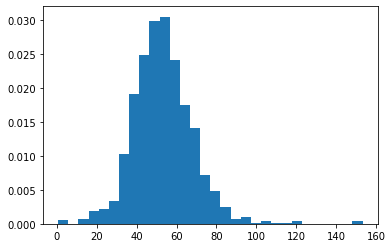

In [58]:
plt.hist(data.iloc[:,6],density = True, bins = 30)

In [59]:
data

,serial,lat,lon,geometry,시리얼,초미세먼지(㎍/㎥),미세먼지(㎍/㎥),기온(℃),상대습도( %),풍향(°),풍속(m/s),초미세먼지 보정(㎍/㎥),미세먼지 보정(㎍/㎥),전송시간
0,V02Q1940046,37.494403,126.831472,POINT (126.83147 37.49440),V02Q1940046,52.687500,82.208333,15.192361,45.857639,NaN,NaN,39.513889,88.312500,2.021044e+11
1,V02Q1940111,37.509299,126.878380,POINT (126.87838 37.50930),V02Q1940111,36.372483,47.540268,16.516779,42.315436,NaN,NaN,32.382550,65.053691,2.021044e+11
2,V02Q1940165,37.496892,126.843727,POINT (126.84373 37.49689),V02Q1940165,32.639610,42.948052,14.998052,46.321429,NaN,NaN,29.512987,59.087662,2.021043e+11
3,V02Q1940056,37.487430,126.838527,POINT (126.83853 37.48743),V02Q1940056,35.226950,46.343972,14.177305,48.251773,NaN,NaN,32.510638,64.904255,2.021044e+11
4,V02Q1940047,37.482145,126.889339,POINT (126.88934 37.48214),V02Q1940047,51.609442,77.467811,15.512446,44.381974,NaN,NaN,38.051502,95.935622,2.021045e+11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1055,OC3CL200044,37.560409,126.978669,POINT (126.97867 37.56041),OC3CL200044,28.027119,75.223729,14.387797,41.216949,NaN,NaN,27.037288,85.471186,2.021044e+11
1056,OC3CL200212,37.566048,126.977400,POINT (126.97740 37.56605),OC3CL200212,25.141935,69.258065,14.041290,42.458065,NaN,NaN,19.541935,56.964516,2.021044e+11
1057,OC3CL200202,37.594270,127.074112,POINT (127.07411 37.59427),OC3CL200202,27.270175,70.877193,13.761053,40.901754,NaN,NaN,24.452632,80.361404,2.021044e+11
1058,OC3CL200203,37.600165,127.111919,POINT (127.11192 37.60016),OC3CL200203,26.489796,77.387755,13.025510,48.816327,NaN,NaN,25.363946,80.846939,2.021044e+11


In [60]:
data1 = data.loc[data.iloc[:,6]<=30,:].reset_index(drop = True)
data2 = data.loc[(data.iloc[:,6]>=31)&(data.iloc[:,6]<=80),:].reset_index(drop = True)
data3 = data.loc[(data.iloc[:,6]>=81)&(data.iloc[:,6]<150),:].reset_index(drop = True)
data4 = data.loc[(data.iloc[:,6]>=150),:].reset_index(drop = True)


In [61]:
#gdf = censor_gpd.to_crs(epsg='4326')
#converted_json = gdf.to_json()


m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)

for i in range(len(data1)):
    folium.Circle(
    location = [data1.lat[i],data1.lon[i]],
    color = "blue").add_to(m)
for i in range(len(data2)):
    folium.Circle(
    location = [data2.lat[i],data2.lon[i]],
    color = "green").add_to(m)
for i in range(len(data3)):
    folium.Circle(
    location = [data3.lat[i],data3.lon[i]],
    color = "orange").add_to(m)
for i in range(len(data4)):
    folium.Circle(
    location = [data4.lat[i],data4.lon[i]],
    color = "red").add_to(m)

    
folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)


#folium.GeoJson(
 #   converted_json
#).add_to(m)
m

# 1. 교통수단

### 1) 버스정류장

In [62]:
bus_g = pd.read_csv("data/서울시버스정류소좌표데이터(2021.01.14.).csv",encoding= "cp949")
bus_n = pd.read_csv("data/BUS_STATION_BOARDING_MONTH_202104.csv",encoding= "cp949")

In [63]:
bus_g.head()

,표준ID,ARS-ID,정류소명,X좌표,Y좌표
0,100000001,1001,종로2가사거리,126.987786,37.569764
1,100000002,1002,창경궁.서울대학교병원,126.996520,37.579179
2,100000003,1003,명륜3가.성대입구,126.998290,37.582709
3,100000004,1004,종로2가.삼일교,126.987507,37.568582
4,100000005,1005,혜화동로터리.여운형활동터,127.001694,37.586230


In [64]:
bus_n.head()

,사용일자,노선번호,노선명,버스정류장ARS번호,역명,승차총승객수,하차총승객수,등록일자
0,20210401,100,100번(하계동~용산구청),11428,한성여객종점,19,2,20210404
1,20210401,100,100번(하계동~용산구청),11374,서울시립북서울미술관,48,0,20210404
2,20210401,100,100번(하계동~용산구청),11373,중계역,51,3,20210404
3,20210401,100,100번(하계동~용산구청),11434,골마을근린공원,318,89,20210404
4,20210401,100,100번(하계동~용산구청),08007,돈암사거리.성신여대입구,105,361,20210404


In [65]:
bus_n.columns

Index(['사용일자', '노선번호', '노선명', '버스정류장ARS번호', '역명', '승차총승객수', '하차총승객수', '등록일자'], dtype='object')

In [66]:
bus_nm_gr = bus_n.iloc[:,[4,5,6]].groupby("역명",as_index =False).mean()

In [67]:
bus_g = bus_g.astype({"ARS-ID":object})

In [68]:
bus_n_gr = bus_n.iloc[:,[3,5,6]].groupby("버스정류장ARS번호",as_index =False).mean()

In [69]:
bus_nm = []
bus_name = []
for i in range(len(bus_g)):
    bus_nm.append(re.sub(r"\s+", "", str(bus_g["ARS-ID"][i])).strip())
    bus_name.append(re.sub(r"\s+", "", str(bus_g["정류소명"][i])).strip())
bus_g["bus_nm"] = bus_nm
bus_g["bus_name"] = bus_name

In [70]:
bus_name2 = []
for i in range(len(bus_nm_gr)):
    bus_name2.append(re.sub(r"\s+", "", str(bus_nm_gr["역명"][i])).strip())
bus_nm_gr["bus_name2"] = bus_name2

In [71]:
bus_nm2 = []
for i in range(len(bus_n_gr)):
    bus_nm2.append(re.sub(r"\s+", "", str(bus_n_gr["버스정류장ARS번호"][i])).strip())
bus_n_gr["bus_nm2"] = bus_nm2

In [72]:
bus = bus_g.merge(bus_n_gr, how = "left",left_on = "bus_nm",right_on = "bus_nm2")
bus.head()

,표준ID,ARS-ID,정류소명,X좌표,Y좌표,bus_nm,bus_name,버스정류장ARS번호,승차총승객수,하차총승객수,bus_nm2
0,100000001,1001,종로2가사거리,126.987786,37.569764,1001,종로2가사거리,NaN,NaN,NaN,NaN
1,100000002,1002,창경궁.서울대학교병원,126.996520,37.579179,1002,창경궁.서울대학교병원,NaN,NaN,NaN,NaN
2,100000003,1003,명륜3가.성대입구,126.998290,37.582709,1003,명륜3가.성대입구,NaN,NaN,NaN,NaN
3,100000004,1004,종로2가.삼일교,126.987507,37.568582,1004,종로2가.삼일교,NaN,NaN,NaN,NaN
4,100000005,1005,혜화동로터리.여운형활동터,127.001694,37.586230,1005,혜화동로터리.여운형활동터,NaN,NaN,NaN,NaN


In [73]:
bus2 = bus_g.merge(bus_nm_gr, how = "left",left_on = "bus_name",right_on = "bus_name2")
bus2.head()

,표준ID,ARS-ID,정류소명,X좌표,Y좌표,bus_nm,bus_name,역명,승차총승객수,하차총승객수,bus_name2
0,100000001,1001,종로2가사거리,126.987786,37.569764,1001,종로2가사거리,종로2가사거리,104.866667,94.758333,종로2가사거리
1,100000002,1002,창경궁.서울대학교병원,126.996520,37.579179,1002,창경궁.서울대학교병원,창경궁.서울대학교병원,126.936364,139.298485,창경궁.서울대학교병원
2,100000003,1003,명륜3가.성대입구,126.998290,37.582709,1003,명륜3가.성대입구,명륜3가.성대입구,168.845098,132.668627,명륜3가.성대입구
3,100000004,1004,종로2가.삼일교,126.987507,37.568582,1004,종로2가.삼일교,종로2가.삼일교,63.753731,68.332090,종로2가.삼일교
4,100000005,1005,혜화동로터리.여운형활동터,127.001694,37.586230,1005,혜화동로터리.여운형활동터,혜화동로터리.여운형활동터,85.456250,131.483333,혜화동로터리.여운형활동터


In [74]:
bus.승차총승객수.isnull().sum()

3578

In [75]:
bus2.승차총승객수.isnull().sum()

443

In [76]:
np.corrcoef(bus2.승차총승객수,bus2.하차총승객수)

array([[nan, nan],
       [nan, nan]])

In [77]:
bus2 = bus2.loc[bus2.승차총승객수.isnull()==False,].reset_index(drop=True)

In [78]:
m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)

for i in range(len(bus2)):
    folium.Circle(
    location = [bus2['Y좌표'][i],bus2['X좌표'][i]],
    radius = int(bus2.하차총승객수[i]/10),
    color = "#173F57").add_to(m)
folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)
m

### 2) 자전거 대여정보

In [79]:
bike_g = pd.read_csv("data/공공자전거 대여소 정보(21.01.31 기준).csv",encoding = "cp949")

In [80]:
bike_rent = pd.read_csv("data/공공자전거 대여이력 정보_2021.01.csv",encoding= "cp949")

In [81]:
bike_g

,대여소 번호,보관소(대여소)명,소재지(위치),상세주소,위도,경도,설치시기,거치대수,거치대수.1,운영방식
0,301,경복궁역 7번출구 앞,종로구,서울특별시 종로구 사직로 지하130,37.575794,126.971451,2015.10.7,16.0,NaN,LCD
1,302,경복궁역 4번출구 뒤,종로구,서울특별시 종로구 사직로 지하130,37.575947,126.974060,2015.10.7,12.0,NaN,LCD
2,303,광화문역 1번출구 앞,종로구,서울특별시 종로구 세종대로 지하189,37.571770,126.974663,2015.10.7,8.0,NaN,LCD
3,304,광화문역 2번출구 앞,종로구,서울특별시 종로구 세종대로 지하172,37.572113,126.977577,2021.1.26,NaN,7.0,QR
4,305,종로구청 옆,종로구,서울특별시 종로구 삼봉로 43,37.572582,126.978355,2015.10.7,16.0,NaN,LCD
...,...,...,...,...,...,...,...,...,...,...
2149,1085,래미안 솔베뉴(고덕로),강동구,양재대로1650,37.554569,127.145874,2020.1.13,NaN,20.0,QR
2150,1086,래미안 솔베뉴(구천면로),강동구,양재대로1650,37.550598,127.145454,2020.1.10,NaN,10.0,QR
2151,1088,풍납사거리(강동),강동구,성내동451-3,37.528122,127.119522,2020.1.14,NaN,12.0,QR
2152,1089,고덕 래미안힐스테이트(201동),강동구,고덕동 675,37.560600,127.146698,2020.1.13,NaN,10.0,QR


In [82]:
bike_rent

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간,이용거리
0,SPB-53145,2021-01-02 20:50:36,3,중랑센터,0,2021-01-02 21:15:41,668,서울축산농협(장안지점),0,25,0.00
1,SPB-53074,2021-01-04 16:02:12,3,중랑센터,0,2021-01-04 16:17:06,668,서울축산농협(장안지점),0,14,0.00
2,SPB-50952,2021-01-13 21:02:05,3,중랑센터,0,2021-01-13 21:14:04,668,서울축산농협(장안지점),0,11,1853.99
3,SPB-52380,2021-01-14 21:02:55,3,중랑센터,0,2021-01-14 21:13:41,668,서울축산농협(장안지점),0,10,0.00
4,SPB-52380,2021-01-18 18:02:08,3,중랑센터,0,2021-01-18 18:15:22,540,군자역 7번출구 베스트샵 앞,0,13,2291.05
...,...,...,...,...,...,...,...,...,...,...,...
806498,SPB-81270,2021-01-24 20:13:33,9999,상담센터,0,2021-01-24 20:56:28,2908,광운대학교 중앙도서관,99,42,3730.00
806499,SPB-39891,2021-01-25 12:10:06,9999,상담센터,0,2021-01-25 12:35:20,626,군자교 서측 녹지대,0,25,3680.00
806500,SPB-32679,2021-01-27 14:47:18,9999,상담센터,0,2021-01-27 15:12:45,2299,한전아트센터 앞,0,25,2471.37
806501,SPB-80712,2021-01-31 14:39:45,9999,상담센터,0,2021-01-31 15:46:49,175,홍연2교옆,99,67,4050.00


In [83]:
bikestop1 = bike_g['보관소(대여소)명']
bikestop2 = []
for i in range(len(bikestop1)):
    bikestop2.append(re.sub(r"\s+", "", bikestop1[i]).strip())
bike_g["bikestop"] = bikestop2

In [84]:
rentstop = []
returnstop = []
for i in range(len(bike_rent)):
    rentstop.append(re.sub(r"\s+", "", bike_rent['대여 대여소명'][i]).strip())
    returnstop.append(re.sub(r"\s+", "", bike_rent['반납대여소명'][i]).strip())

In [85]:
rentstop2 = pd.DataFrame(rentstop).value_counts().rename_axis('rentstop').reset_index(name='cnt1')
returnstop2 = pd.DataFrame(returnstop).value_counts().rename_axis('returnstop').reset_index(name='cnt2')

In [86]:
bike_mg = bike_g.merge(rentstop2,left_on ="bikestop",right_on = "rentstop")
bike_mg = bike_mg.merge(returnstop2,left_on= "bikestop",right_on = "returnstop")
bike_mg = bike_mg[bike_mg["위도"].isnull()!=True].reset_index(drop=True)
bike_mg.head()

,대여소 번호,보관소(대여소)명,소재지(위치),상세주소,위도,경도,설치시기,거치대수,거치대수.1,운영방식,bikestop,rentstop,cnt1,returnstop,cnt2
0,301,경복궁역 7번출구 앞,종로구,서울특별시 종로구 사직로 지하130,37.575794,126.971451,2015.10.7,16.0,NaN,LCD,경복궁역7번출구앞,경복궁역7번출구앞,413,경복궁역7번출구앞,333
1,302,경복궁역 4번출구 뒤,종로구,서울특별시 종로구 사직로 지하130,37.575947,126.974060,2015.10.7,12.0,NaN,LCD,경복궁역4번출구뒤,경복궁역4번출구뒤,711,경복궁역4번출구뒤,721
2,303,광화문역 1번출구 앞,종로구,서울특별시 종로구 세종대로 지하189,37.571770,126.974663,2015.10.7,8.0,NaN,LCD,광화문역1번출구앞,광화문역1번출구앞,587,광화문역1번출구앞,590
3,304,광화문역 2번출구 앞,종로구,서울특별시 종로구 세종대로 지하172,37.572113,126.977577,2021.1.26,NaN,7.0,QR,광화문역2번출구앞,광화문역2번출구앞,391,광화문역2번출구앞,405
4,305,종로구청 옆,종로구,서울특별시 종로구 삼봉로 43,37.572582,126.978355,2015.10.7,16.0,NaN,LCD,종로구청옆,종로구청옆,508,종로구청옆,542


In [87]:
#gdf = censor_gpd.to_crs(epsg='4326')
#converted_json = gdf.to_json()


m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)

for i in range(len(bike_mg)):
    folium.Circle(
    location = [bike_mg['위도'][i],bike_mg['경도'][i]],
    radius = int(bike_mg.cnt1[i]/10),
    color = "#135e96").add_to(m)
folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)
#folium.GeoJson(
 #   converted_json
#).add_to(m)
m

### 3) 자동차

car = pd.read_excel("data/'21년 1월 기준 자치구별 연료별 자동차등록 현황.xls",header =1).iloc[:,1:]
car.to_csv("data/car.csv",encoding = "cp949")

In [88]:
car = pd.read_csv("data/car.csv",encoding = "cp949")

In [89]:
car.head()

,시군구별,연료별,용도별,승 용,승 합,화 물,특 수,계
0,합 계,계,계,2714483,106065,330038,8966,3159552
1,종로구,CNG,비사업용,9,4,22,0,35
2,종로구,CNG,사업용,0,89,0,0,89
3,종로구,경유,비사업용,10472,3068,3825,128,17493
4,종로구,경유,사업용,60,212,644,52,968


### 4) 주차장

parking = pd.read_csv("data/주차장.txt",delimiter = "\t")
parking.to_csv("data/parking.csv",encoding= "cp949")

In [90]:
parking =pd.read_csv("data/parking.csv",encoding = "cp949")
parking.head()

FileNotFoundError: [Errno 2] No such file or directory: 'data/parking.csv'

### 5) 지하철 및 환기구 정보


## 3. 행정구역별 인구

In [ ]:
ppl_nm = pd.read_csv("data/LOCAL_PEOPLE_DONG_202104.csv", index_col=False)

In [ ]:
ppl_g = pd.read_csv("data/서울시 행정동별 지역난방 사용량 2008년 위치정보 (좌표계_ WGS1984).csv",encoding = "cp949")

In [ ]:
ppl_map = pd.read_csv("data/행정동코드_매핑정보_20200325.csv")
ppl_map=ppl_map[1:].reset_index(drop=True)
ppl_map = ppl_map.astype({"통계청행정동코드":int,"행자부행정동코드":int})

In [ ]:
ppl_nm_gr = ppl_nm.groupby("행정동코드", as_index=False).mean()

In [ ]:
ppl_g = ppl_g.merge(ppl_map,how="left",left_on = "행정동명",right_on = "행정동명")

In [ ]:
ppl_g = ppl_g.drop([289,321],axis=0).reset_index(drop=True)

In [ ]:
ppl_g.loc[ppl_g.위도.isnull(),]

In [ ]:
ppl = ppl_nm_gr.merge(ppl_g,how = "left",left_on = "행정동코드",right_on = "행자부행정동코드")
ppl = ppl.loc[:,['행정동코드_x','총생활인구수', '남자0세부터9세생활인구수',
       '남자10세부터14세생활인구수', '남자15세부터19세생활인구수', '남자20세부터24세생활인구수',
       '남자25세부터29세생활인구수', '남자30세부터34세생활인구수', '남자35세부터39세생활인구수',
       '남자40세부터44세생활인구수', '남자45세부터49세생활인구수', '남자50세부터54세생활인구수',
       '남자55세부터59세생활인구수', '남자60세부터64세생활인구수', '남자65세부터69세생활인구수', '남자70세이상생활인구수',
       '여자0세부터9세생활인구수', '여자10세부터14세생활인구수', '여자15세부터19세생활인구수',
       '여자20세부터24세생활인구수', '여자25세부터29세생활인구수', '여자30세부터34세생활인구수',
       '여자35세부터39세생활인구수', '여자40세부터44세생활인구수', '여자45세부터49세생활인구수',
       '여자50세부터54세생활인구수', '여자55세부터59세생활인구수', '여자60세부터64세생활인구수',
       '여자65세부터69세생활인구수', '여자70세이상생활인구수','경도', '위도','통계청행정동코드', '행자부행정동코드', '시도명',
       '시군구명','행정동명']]

In [ ]:
miss = ppl.loc[ppl.위도.isnull(),]

In [ ]:
miss = miss.merge(ppl_map,how = "left", left_on = "행정동코드_x",right_on = "행자부행정동코드")

In [ ]:
miss = miss.drop(miss.columns[range(32,37)],axis =1)

In [ ]:
miss.columns = ppl.columns

In [ ]:
ppl2 = pd.concat([ppl.loc[ppl.위도.isnull()==False,], miss],axis=0).reset_index(drop=True)

위도, 경도 없는것 직접 넣어줄것

In [ ]:
ppl2 = ppl2.loc[ppl2.위도.isnull()==False,]

In [ ]:
m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)

for i in range(len(ppl2)):
    folium.Circle(
    location = [ppl2['위도'][i],ppl2['경도'][i]],
    radius = int(ppl2.총생활인구수[i]/100),
    color = "#173F57").add_to(m)
folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)
m

## 거주인구

In [ ]:
pop = pd.read_csv("data/주민등록인구.txt",delimiter = "\t")

In [ ]:
pop.to_csv("population.csv",encoding = "cp949")

In [ ]:
3/5

## 인구이동

In [ ]:
pop_move = pd.read_csv("data/pop_move.txt",delimiter = "\t")

In [ ]:
pop_move.head()

In [ ]:
pop_move.to_csv("data/pop_move.csv",encoding = "cp949")

## 인구밀도

In [ ]:
pop_density = pd.read_csv("data/pop_density.txt",delimiter = "\t")

In [ ]:
pop_density.head()

In [ ]:
pop_density.to_csv("data/pop_density.csv",encoding = "cp949")

### 4. 공원

In [ ]:
park = pd.read_csv("data/서울시 주요 공원현황.csv",encoding="cp949").loc[:,["공원번호","공원명","면적","X좌표(WGS84)","Y좌표(WGS84)"]]

In [ ]:
park.iloc[131,3] = 126.9738
park.iloc[131,4] = 37.5565
park = park.rename(columns = {"X좌표(WGS84)":"경도","Y좌표(WGS84)":"위도"})

In [ ]:
park

In [ ]:
m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)

for i in range(len(park)):
    folium.Circle(
    location = [park['위도'][i],park['경도'][i]],
    radius = int(park.면적[i]/5000),
    color = "green").add_to(m)
folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)
m

### 5. 가로수

In [ ]:
tree = gpd.read_file("data/TN_STTREE_W.shp")

In [ ]:
temp = tree.head()

In [ ]:
tree_g = pd.concat([tree.GU_NM,tree.geometry.x,tree.geometry.y],axis=1)
tree_g = tree_g.rename(columns = {0:"경도",1:"위도"})
tree_g

m = folium.Map(
    location=[37.54238169591348,126.99068745821812],
 attr = '서울',
    zoom_start=12
)
for i in range(len(tree_g)):
    folium.Circle(
    location = [tree_g.위도[i],tree_g.경도[i]],
    radius = 2,
    color = "black").add_to(m)
folium.plugins.Fullscreen(position='topright',  
                   title='FULL SCREEN ON', 
                   title_cancel='FULL SCREEN OFF',
                   force_separate_button=True
                  ).add_to(m)

m